# Dropsonde Overlay Creation

This code opens EOL dropsonde data for each individual dropsonde file in a folder and plots it on a Skew-T using Metpy. These files are saved out ot the desktop.

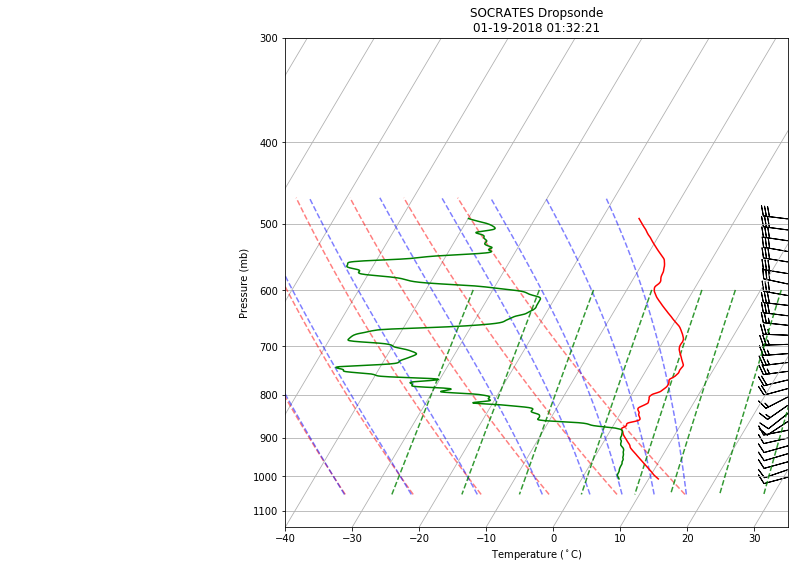

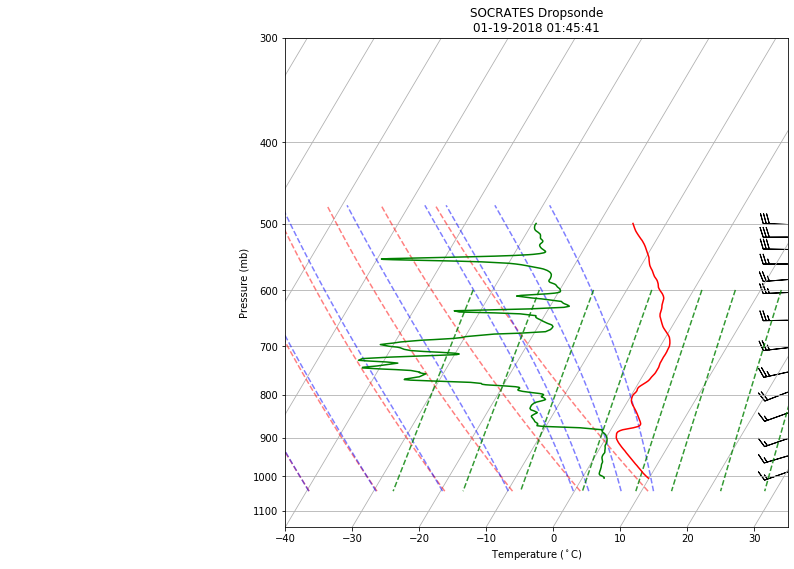

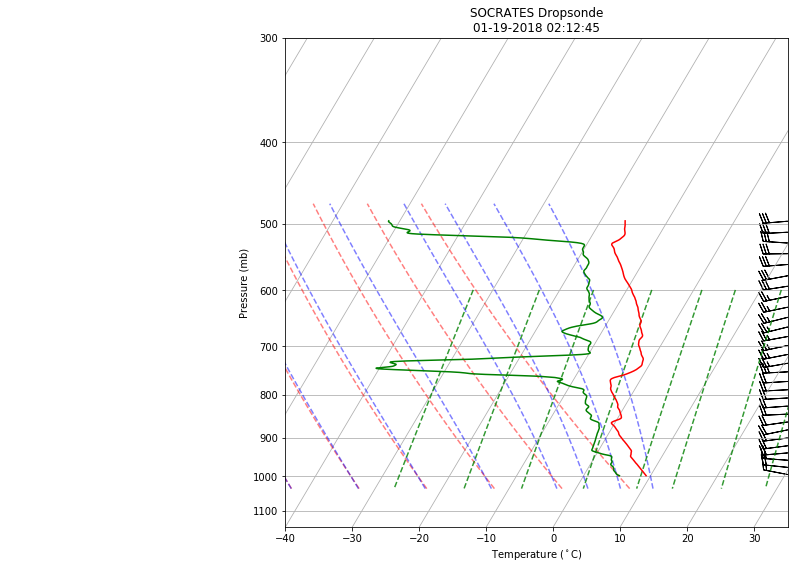

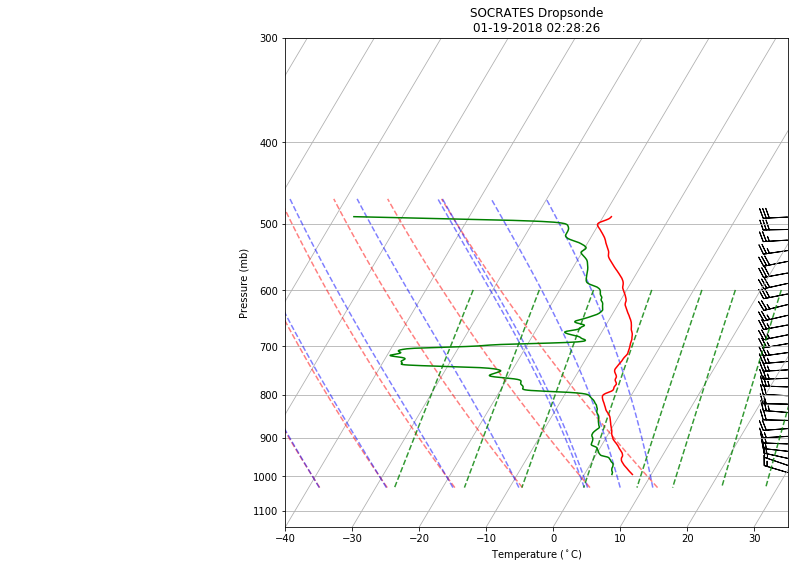

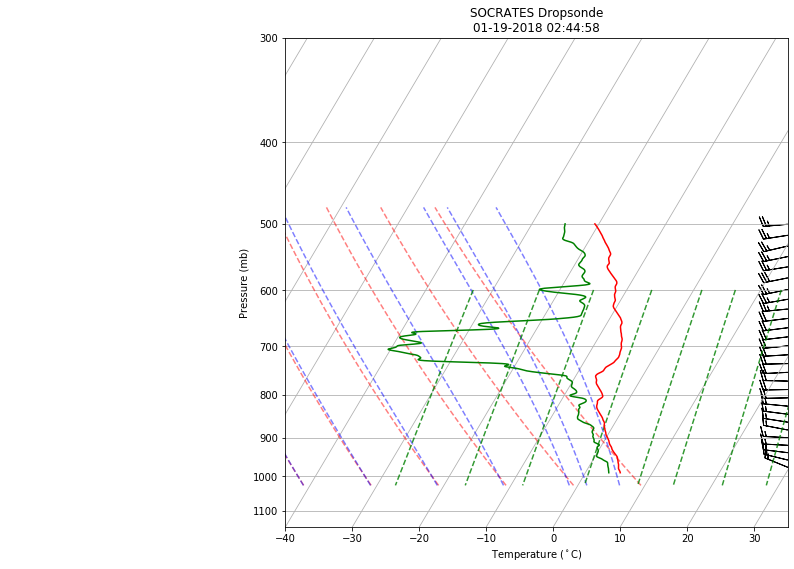

...

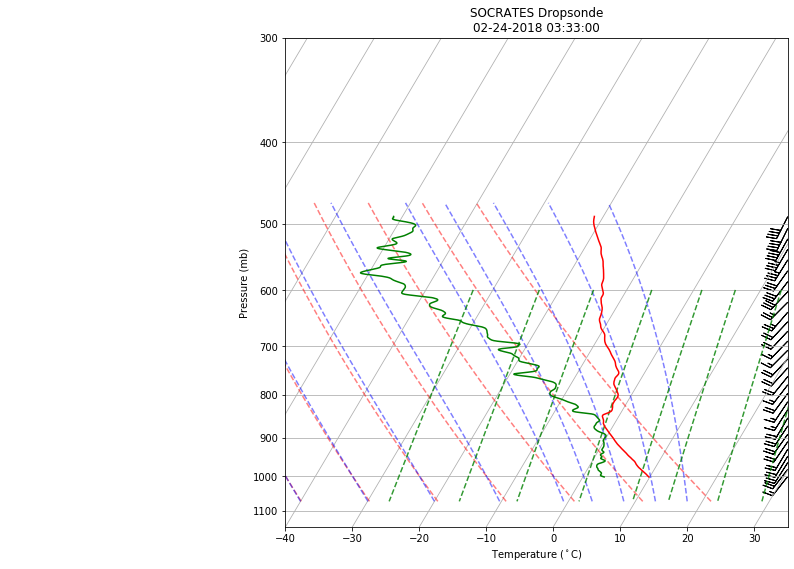

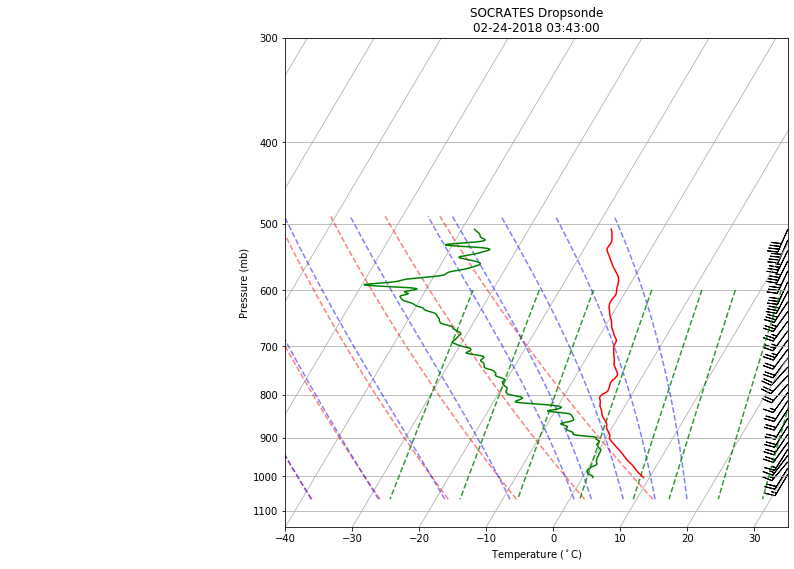

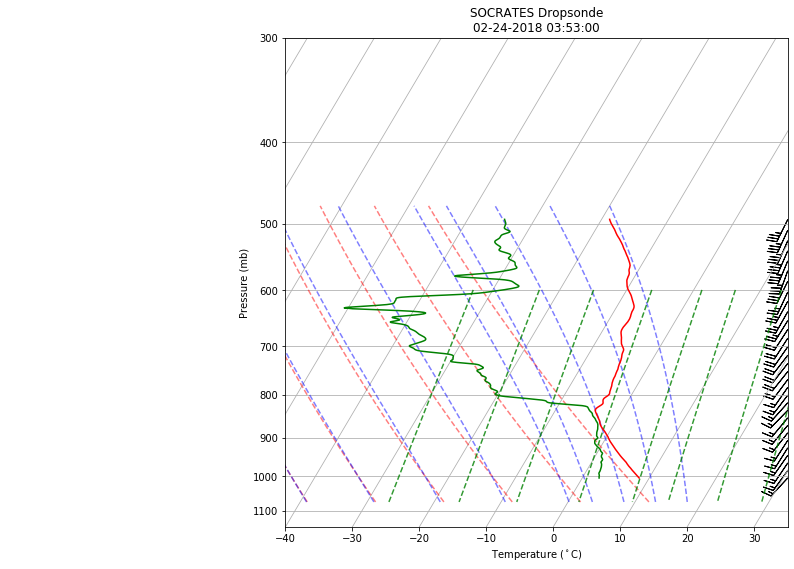

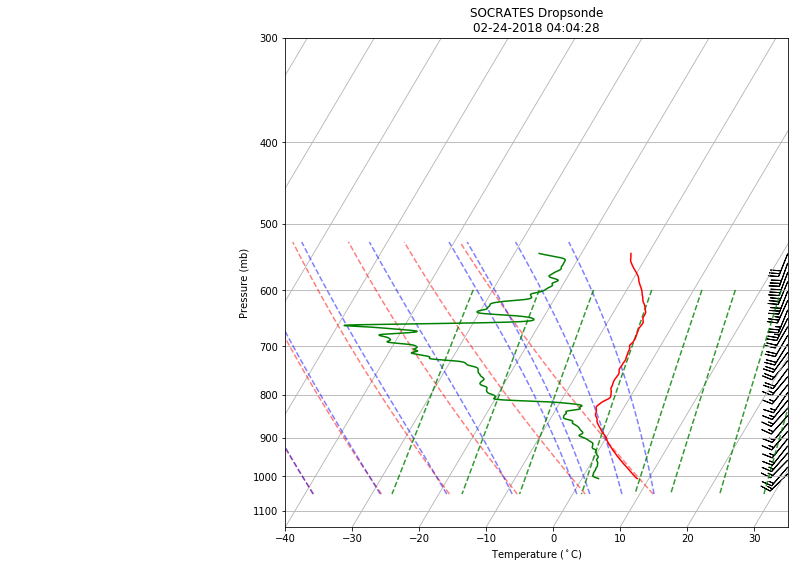

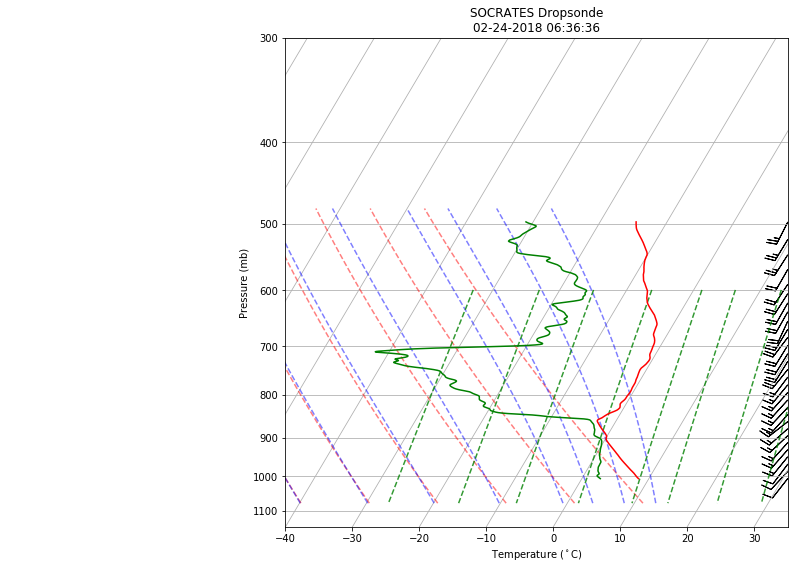

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import glob

import metpy.calc as mpcalc
from metpy.cbook import get_test_data
from metpy.plots import add_metpy_logo, SkewT
from metpy.units import units


dropsonde_file_list = glob.glob('/Volumes/HD/SOCRATES/Data/Quality Controlled Dropsonde Data/*')

for i in range(pd.DataFrame(dropsonde_file_list).shape[0]):

    dropsonde_fname = open(dropsonde_file_list[i])
    dropsonde_data = [line.rstrip('\r\n') for line in dropsonde_fname]
    dropsonde_data = dropsonde_data[14::]
    dropsonde_data = [list(map(float, i.strip().split())) for i in dropsonde_data]

    dropsonde_df = pd.DataFrame(dropsonde_data)
    dropsonde_df_column_header = ['Time Elapsed', 'Hour', 'Minute', 'Second', 'Pressure', 'Temperature', 'Dewpoint', 'Relative Humidity', 'U Wind', 'V Wind', 'Wind Speed', 'Wind Direction', 'Height Change', 'Geopotential Altitude', 'Longitude', 'Latitude', 'GPS Altitude']
    dropsonde_df.columns = dropsonde_df_column_header

    year = dropsonde_file_list[i][61:65]
    month = dropsonde_file_list[i][65:67]
    day = dropsonde_file_list[i][67:69]

    hour = dropsonde_file_list[i][70:72]
    minute = dropsonde_file_list[i][72:74]
    second = dropsonde_file_list[i][74:76]

    dropsonde_df.index = pd.to_datetime(year+'-'+month+'-'+day) + pd.to_timedelta(dropsonde_df.Hour, unit = 'h') + pd.to_timedelta(dropsonde_df.Minute, unit = 'm') + pd.to_timedelta(dropsonde_df.Second, unit = 's')

    dropsonde_df = dropsonde_df[dropsonde_df['Pressure'] > -500]
    dropsonde_df = dropsonde_df[dropsonde_df['Temperature'] > -500]
    dropsonde_df = dropsonde_df[dropsonde_df['Dewpoint'] > -500]
    dropsonde_df = dropsonde_df[dropsonde_df['Relative Humidity'] > -500]
    dropsonde_df = dropsonde_df[dropsonde_df['U Wind'] > -500]
    dropsonde_df = dropsonde_df[dropsonde_df['V Wind'] > -500]
    dropsonde_df = dropsonde_df[dropsonde_df['Wind Speed'] > -500]
    dropsonde_df = dropsonde_df[dropsonde_df['Height Change'] > -500]
    dropsonde_df = dropsonde_df[dropsonde_df['Longitude'] > -500]
    dropsonde_df = dropsonde_df[dropsonde_df['Latitude'] > -500]
    
    
    
    p = dropsonde_df['Pressure'].values * units.hPa
    T = dropsonde_df['Temperature'].values * units.degC
    Td = dropsonde_df['Dewpoint'].values * units.degC
    wind_speed = dropsonde_df['Wind Speed'].values * units.knots
    wind_dir = dropsonde_df['Wind Direction'].values * units.degrees
    u, v = mpcalc.wind_components(wind_speed, wind_dir)
    height = dropsonde_df['GPS Altitude']

    plt.rcParams['figure.figsize'] = (9, 9)
    skew = SkewT()

    skew.plot(p, T, 'r')
    skew.plot(p, Td, 'g')

    skew.plot_barbs(p[1::30], u[1::30], v[1::30])

    skew.plot_dry_adiabats()
    skew.plot_moist_adiabats()
    skew.plot_mixing_lines()
    skew.ax.set_ylim(1150, 300)
    skew.ax.set_xlim(-40, 35)
    
    skew.ax.set_ylabel('Pressure (mb)')
    skew.ax.set_xlabel('Temperature ($^\circ$C)')

    plt.title('SOCRATES Dropsonde' + '\n' + month + '-' + day + '-' + year + ' ' + hour + ':' + minute + ':' + second)
    plt.savefig('Desktop/SOCRATES Dropsonde Images/socrates_dropsonde_'+ month + day + year + '_' + hour + minute + second + '.pdf', format='pdf', dpi = 500)
    plt.show()